In [1]:
1+1

2

# We are exploring the S&P 500 market index using basic time series analysis techniques just for fun.

We will test the exponential fit by fitting a regression line to the log transform and predict the upcoming cusp as of Mar 30 2024


In [2]:
# %pip install yfinance pandas seaborn matplotlib numpy statsmodels scipy scikit-learn dtale ipykernel ipywidgets bokeh jupyter_bokeh

In [3]:
# Importing the libraries, setting up the environment and downloading the data

import yfinance as yf
from datetime import date
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import dtale
from bokeh.plotting import figure, show, output_file, save
from bokeh.models import ColumnDataSource, NumeralTickFormatter, HoverTool, CrosshairTool
from bokeh.io import output_notebook



# Setting up boken for jupyter notebook otuput instead of browser
# output_notebook()



# Downloading S&P 500 data from Yahoo Finance
df = yf.download('^GSPC', '1931-01-01', '2024-03-28')

df['Day']= df.index

# convert the datetime index to ordinal values, which can be used to plot a regression line
df.index = df.index.map(pd.Timestamp.toordinal)

# Logarithmic transformation (assuming positive 'Close' values)
df['Log_Close'] = np.log(df['Close'])  

display(df.iloc[:, :])


[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close
Date,,,,,,,,
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0,1931-01-02,2.763170
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0,1931-01-05,2.768204
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0,1931-01-06,2.780681
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0,1931-01-07,2.714032
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0,1931-01-08,2.786861
...,...,...,...,...,...,...,...,...
738966,5253.430176,5261.100098,5240.660156,5241.529785,5241.529785,4207730000,2024-03-21,8.564369
738967,5242.479980,5246.089844,5229.870117,5234.180176,5234.180176,3374700000,2024-03-22,8.562966
738970,5219.520020,5229.089844,5216.089844,5218.189941,5218.189941,3331360000,2024-03-25,8.559906


Fitting the regression line

In [4]:
# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# create a linear regression model
model = LinearRegression()

# fit the model
model.fit(data[['Date']], data['Log_Close'])

slope = model.coef_[0]
intercept = model.intercept_
R2 = model.score(data[['Date']], data['Log_Close'])

equation = f'Lin_Regr_Log_Close = {slope:.4f} * Date {'+' if intercept >=0 else ''}{intercept:.4f}'


# make predictions
data['Linear'] = model.predict(data[['Date']])
data['Prediction_of_Close'] = np.exp(data['Linear'])



#print the model details including the slope, intercept, r-squared, and p-value, etc.
print('Slope:', slope)
print('Intercept:', intercept)
print('R-squared:', R2)

equation = f'Lin_Regr_Log_Close = {slope:.4f}*Date{'+' if intercept >=0 else ''}{intercept:.4f}'
print('The equation of the regression line is:', equation)

Slope: 0.0001901772302090598
Intercept: -132.2801903074971
R-squared: 0.9777985283548668
The equation of the regression line is: Lin_Regr_Log_Close = 0.0002*Date-132.2802


In [5]:
#Display the data
display(data.iloc[:, :])

,Date,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.849148,6.354401
1,705287,7.550000,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.849338,6.355610
2,705288,8.080000,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.849528,6.356819
3,705289,8.220000,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.849718,6.358028
4,705290,8.570000,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.849908,6.359237
...,...,...,...,...,...,...,...,...,...,...,...
23167,738966,5253.430176,5261.100098,5240.660156,5241.529785,5241.529785,4207730000,2024-03-21,8.564369,8.254317,3844.184597
23168,738967,5242.479980,5246.089844,5229.870117,5234.180176,5234.180176,3374700000,2024-03-22,8.562966,8.254507,3844.915743
23169,738970,5219.520020,5229.089844,5216.089844,5218.189941,5218.189941,3331360000,2024-03-25,8.559906,8.255078,3847.110016
23170,738971,5228.850098,5235.160156,5203.419922,5203.580078,5203.580078,3871790000,2024-03-26,8.557102,8.255268,3847.841718


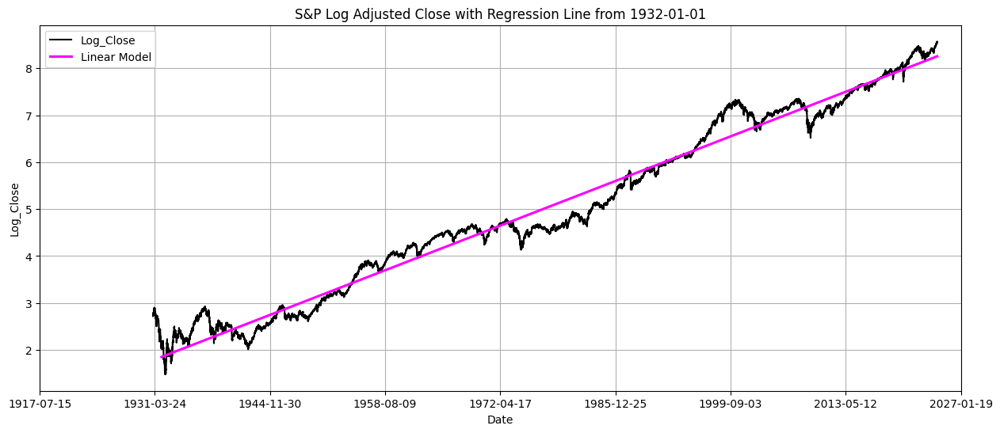

In [6]:

# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data_sn=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 1932-01-01')

# add a regression line
sns.regplot(data=data_sn, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()

Plot in seaborn

## Making a dynamic version of the plot using Bokeh

In [7]:
display(data.iloc[:, :])

,Date,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.849148,6.354401
1,705287,7.550000,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.849338,6.355610
2,705288,8.080000,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.849528,6.356819
3,705289,8.220000,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.849718,6.358028
4,705290,8.570000,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.849908,6.359237
...,...,...,...,...,...,...,...,...,...,...,...
23167,738966,5253.430176,5261.100098,5240.660156,5241.529785,5241.529785,4207730000,2024-03-21,8.564369,8.254317,3844.184597
23168,738967,5242.479980,5246.089844,5229.870117,5234.180176,5234.180176,3374700000,2024-03-22,8.562966,8.254507,3844.915743
23169,738970,5219.520020,5229.089844,5216.089844,5218.189941,5218.189941,3331360000,2024-03-25,8.559906,8.255078,3847.110016
23170,738971,5228.850098,5235.160156,5203.419922,5203.580078,5203.580078,3871790000,2024-03-26,8.557102,8.255268,3847.841718


In [8]:
# adding column selection to the plot_regression_line function
def plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html'):
    # Create a new figure
    p = figure(title=title, x_axis_label='Year', y_axis_label='Log S&P 500 Index', width=1000, height=600, x_axis_type='datetime')

    # Define the source variable
    source = ColumnDataSource(data=data)

    # Define the colors for the lines
    colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if needed

    # Plot the lines
    for i in range(1, len(cols)):
        p.line(x=cols[0], y=cols[i], source=source, line_width=2, legend_label=cols[i], color=colors[i-1])  # Use different color for each line

    # Add hover functionality
    hover_tool = HoverTool(tooltips=[('Year', '@' + cols[0] + '{%F}'), (cols[1], '@' + cols[1] + '{0,0.00}'), (cols[2], '@' + cols[2] + '{0,0.00}')], formatters={'@' + cols[0]: 'datetime'})
    p.add_tools(hover_tool)

    # Add the equation of the regression line
    # p.text(x=400 , y=0.5, text=[equation], text_font_size='18pt', text_align='center')

    # Format the y-axis tick labels
    p.yaxis.formatter = NumeralTickFormatter(format='0,0.00')

    # Relocate the legend to top left
    p.legend.location = 'top_left'

    

    # Show the plot
    if if_notebook:
        output_notebook()
        show(p)
    else:
        show(p)

    # Save the plot
    if if_save:
        output_file(filename, title=title)
        save(p)
        print(f'The plot is saved as {filename}.')
    else:
        print('The plot is displayed in the notebook.')

    return p


plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html')



Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1001', ...)

We extend daily till year_future year and predict 

In [9]:
data['Day'].max()
plot_regression_line(data.loc[data['Day'] >= pd.to_datetime('1950-01-01')], equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1085', ...)

In [10]:
#We extend daily intil the year year_future forward  
# create a new dataframe for the future dates
year_future = 2030

today = date.today()

# convert the 'Day' column to datetime
data['Day'] = pd.to_datetime(data['Day'])

delta_years = year_future - data['Day'].max().year
future_dates = pd.date_range(start=data['Day'].max(), periods=delta_years*365, freq='D')


print(future_dates)

# convert the future dates to ordinal
future_dates_od = future_dates.map(pd.Timestamp.toordinal)
print(future_dates_od)

# convert future_dates to a numpy array
future_dates_od_np = np.array(future_dates_od)
print(future_dates_od_np)


#create a new dataframe for the future dates and add above 3 columns
future_data = pd.DataFrame(future_dates, columns=['Day'])
future_data['Day_od'] = future_dates_od

#predict the S&P 500 index using the linear regression model and add to the dataframe
future_data['Linear'] = model.predict(future_dates_od_np.reshape(-1, 1))
future_data['Prediction_of_Close'] = np.exp(future_data['Linear'])

display(future_data.iloc[:, :])

DatetimeIndex(['2024-03-27', '2024-03-28', '2024-03-29', '2024-03-30',
               '2024-03-31', '2024-04-01', '2024-04-02', '2024-04-03',
               '2024-04-04', '2024-04-05',
               ...
               '2030-03-16', '2030-03-17', '2030-03-18', '2030-03-19',
               '2030-03-20', '2030-03-21', '2030-03-22', '2030-03-23',
               '2030-03-24', '2030-03-25'],
              dtype='datetime64[ns]', length=2190, freq='D')
Index([738972, 738973, 738974, 738975, 738976, 738977, 738978, 738979, 738980,
       738981,
       ...
       741152, 741153, 741154, 741155, 741156, 741157, 741158, 741159, 741160,
       741161],
      dtype='int64', length=2190)
[738972 738973 738974 ... 741159 741160 741161]


/Users/norayr/.pyenv/versions/3.12.0/envs/Market/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Day,Day_od,Linear,Prediction_of_Close
0,2024-03-27,738972,8.255458,3848.573559
1,2024-03-28,738973,8.255648,3849.305540
2,2024-03-29,738974,8.255838,3850.037660
3,2024-03-30,738975,8.256028,3850.769919
4,2024-03-31,738976,8.256219,3851.502317
...,...,...,...,...
2185,2030-03-21,741157,8.670995,5831.299204
2186,2030-03-22,741158,8.671185,5832.408290
2187,2030-03-23,741159,8.671375,5833.517587
2188,2030-03-24,741160,8.671566,5834.627094


In [11]:
# Concatenate the original data frame and the future data frame
extended_df = pd.concat([df, future_data[['Day', 'Prediction_of_Close']]])

# add day ordinal to the extended dataframe
extended_df['Day_od'] = extended_df['Day'].apply(pd.to_datetime).apply(pd.Timestamp.toordinal)

# add the regression line to the extended dataframe
extended_df['Linear'] = model.predict(np.array(extended_df[['Day_od']]).reshape(-1, 1))

# add the prediction of the close to the extended dataframe
extended_df['Prediction_of_Close'] = np.exp(extended_df['Linear'])

# Display the extended data frame
display(extended_df.iloc[:, :])

/Users/norayr/.pyenv/versions/3.12.0/envs/Market/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.926019,704919,1.779353
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.929401,704922,1.779923
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.930529,704923,1.780113
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931657,704924,1.780304
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932785,704925,1.780494
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-21,NaN,5831.299204,741157,8.670995
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-22,NaN,5832.408290,741158,8.671185
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-23,NaN,5833.517587,741159,8.671375
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-24,NaN,5834.627094,741160,8.671566


In [12]:
#display the data from 1950 to 2026
data_1950_2026 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('1950-01-01')]
display(data_1950_2026.iloc[:, :])
plot_regression_line(data_1950_2026, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
711860,16.66,16.66,16.66,16.66,16.66,1260000.0,1950-01-03,2.813011,22.184033,711860,3.099373
711861,16.85,16.85,16.85,16.85,16.85,1890000.0,1950-01-04,2.824351,22.188252,711861,3.099563
711862,16.93,16.93,16.93,16.93,16.93,2550000.0,1950-01-05,2.829087,22.192472,711862,3.099753
711863,16.98,16.98,16.98,16.98,16.98,2010000.0,1950-01-06,2.832036,22.196693,711863,3.099943
711866,17.08,17.08,17.08,17.08,17.08,2520000.0,1950-01-09,2.837908,22.209361,711866,3.100514
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-21,NaN,5831.299204,741157,8.670995
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-22,NaN,5832.408290,741158,8.671185
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-23,NaN,5833.517587,741159,8.671375
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-24,NaN,5834.627094,741160,8.671566


Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p1169', ...)

In [13]:
# plotting the extended data frame using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols = ['Day', 'Close', 'Prediction_of_Close'], if_save=True, filename='Prediction_2030_S&P_500_Index.html')


Loading BokehJS ...

The plot is saved as Prediction_2030_S&P_500_Index.html.


figure(id='p1254', ...)

In [14]:
# save bokeh plot to an html file
output_file = 'S&P_500_Index_1931_2030.html'
show(plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols = ['Day', 'Close', 'Prediction_of_Close'], if_save=True, filename='Prediction_2030_S&P_500_Index.html'))


Loading BokehJS ...

TypeError: 'str' object is not callable

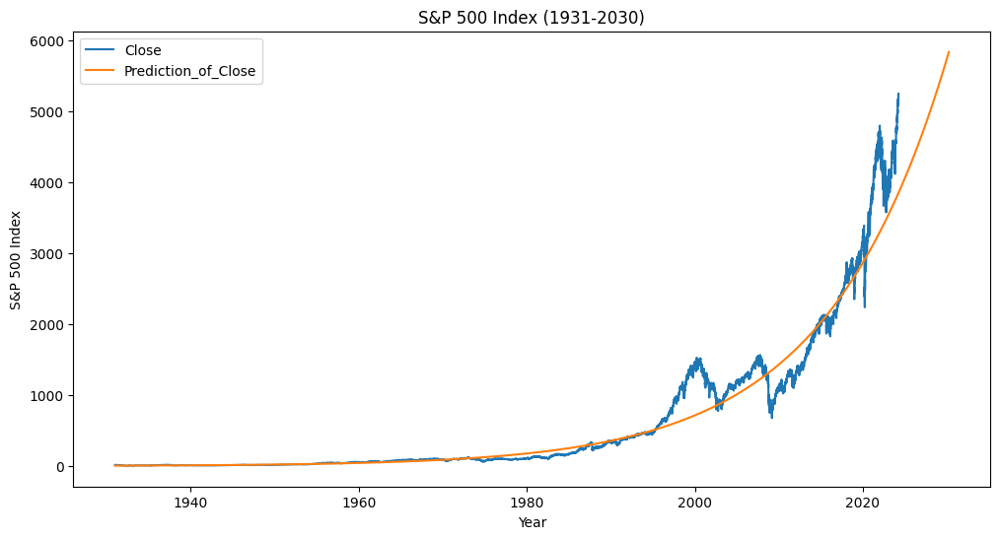

In [ ]:
# plot the original data and the extended data
plt.figure(figsize=(12, 6))
sns.lineplot(x='Day', y='Close', data=extended_df, label='Close')
sns.lineplot(x='Day', y='Prediction_of_Close', data=extended_df, label='Prediction_of_Close')
plt.title(f'S&P 500 Index (1931-{year_future})')
plt.xlabel('Year')
plt.ylabel('S&P 500 Index')
plt.legend()
plt.show()


In [ ]:
# D-Tale
d = dtale.show(df, host='localhost')   

## The Slope from 2009 looks different, let's fit a linear regression model to the data from 2009 to 2024

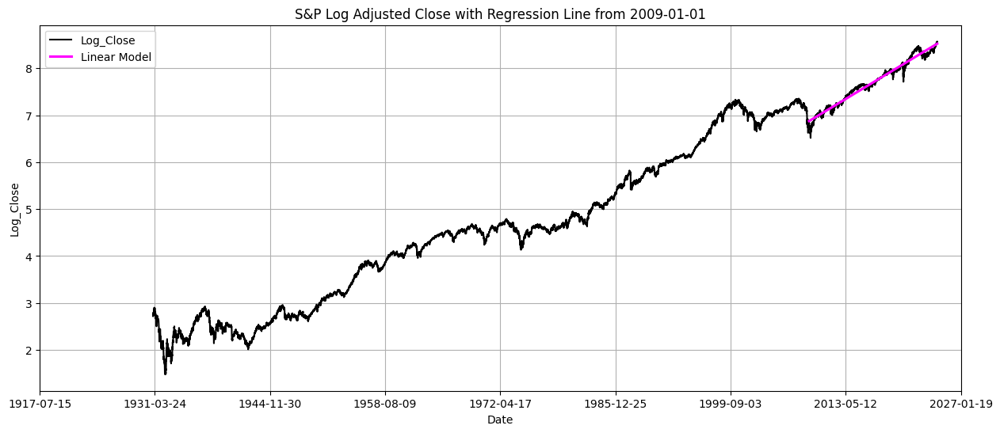

In [ ]:


# convert the regression line start date to ordinal
x1 = pd.to_datetime('2009-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 2009-01-01')

# add a regression line
sns.regplot(data=data, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()


In [ ]:
extended_df

,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.926019,704919,1.779353
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.929401,704922,1.779923
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.930529,704923,1.780113
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931657,704924,1.780304
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932785,704925,1.780494
...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-21,NaN,5831.299204,741157,8.670995
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-22,NaN,5832.408290,741158,8.671185
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-23,NaN,5833.517587,741159,8.671375
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-24,NaN,5834.627094,741160,8.671566


In [17]:
# Chunk the extended data frame starting from 2009-05-01 
df_2009 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('2009-05-01')]

#truncate df_2009 to the last day we have data in the close column  
df_2009 = df_2009.loc[df_2009['Close'].notnull()]


# Build a regression model to the log
model_2009 = LinearRegression()
model_2009.fit(df_2009[['Day_od']], df_2009['Log_Close'])

# Predict the close using the regression model
df_2009['2009_regr'] = np.exp(model_2009.predict(df_2009[['Day_od']]))

# Display the chunked data frame with the 2009_regr column for close
display(df_2009)


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr
733528,872.739990,880.479980,866.099976,877.520020,877.520020,5.312170e+09,2009-05-01,6.777100,1366.670834,733528,7.220133,1019.654641
733531,879.210022,907.849976,879.210022,907.239990,907.239990,7.038840e+09,2009-05-04,6.810407,1367.450786,733531,7.220704,1020.547688
733532,906.099976,907.700012,897.340027,903.799988,903.799988,6.882860e+09,2009-05-05,6.806608,1367.710868,733532,7.220894,1020.845544
733533,903.950012,920.280029,903.950012,919.530029,919.530029,8.555040e+09,2009-05-06,6.823863,1367.971000,733533,7.221084,1021.143487
733534,919.580017,929.580017,901.359985,907.390015,907.390015,9.120100e+09,2009-05-07,6.810572,1368.231182,733534,7.221274,1021.441517
...,...,...,...,...,...,...,...,...,...,...,...,...
738966,5253.430176,5261.100098,5240.660156,5241.529785,5241.529785,4.207730e+09,2024-03-21,8.564369,3844.184597,738966,8.254317,4984.640309
738967,5242.479980,5246.089844,5229.870117,5234.180176,5234.180176,3.374700e+09,2024-03-22,8.562966,3844.915743,738967,8.254507,4986.095121
738970,5219.520020,5229.089844,5216.089844,5218.189941,5218.189941,3.331360e+09,2024-03-25,8.559906,3847.110016,738970,8.255078,4990.462104
738971,5228.850098,5235.160156,5203.419922,5203.580078,5203.580078,3.871790e+09,2024-03-26,8.557102,3847.841718,738971,8.255268,4991.918615


In [18]:
#lets add 2009_regr to the extended_df
extended_df['2009_regr_prediction'] = np.exp(model_2009.predict(extended_df[['Day_od']]))

extended_df['2009_regr_linear'] = model_2009.predict(extended_df[['Day_od']])
display(extended_df)


,Open,High,Low,Close,Adj Close,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr_prediction,2009_regr_linear
704919,15.850000,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.926019,704919,1.779353,0.241387,-1.421354
704922,15.930000,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.929401,704922,1.779923,0.241598,-1.420479
704923,16.129999,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.930529,704923,1.780113,0.241669,-1.420187
704924,15.090000,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.931657,704924,1.780304,0.241739,-1.419895
704925,16.230000,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.932785,704925,1.780494,0.241810,-1.419604
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-21,NaN,5831.299204,741157,8.670995,9447.317602,9.153486
2186,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-22,NaN,5832.408290,741158,8.671185,9450.074886,9.153778
2187,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-23,NaN,5833.517587,741159,8.671375,9452.832974,9.154070
2188,NaN,NaN,NaN,NaN,NaN,NaN,2030-03-24,NaN,5834.627094,741160,8.671566,9455.591868,9.154362


In [21]:
# plot the exetennded data frame with the 2009_regr column using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols=['Day', 'Close', 'Prediction_of_Close', '2009_regr_prediction'],if_notebook=False, if_save=True, filename='Prediction_2030_S&P_500_Index.html')

TypeError: 'str' object is not callable